Load Julia packages (libraries) needed  for the snippets in chapter 0

In [1]:
using StatisticalRethinking
gr(size=(600,300))

Plots.GRBackend()

### snippet 3.2

Grid of 1001 steps

In [2]:
p_grid = range(0, step=0.001, stop=1)

0.0:0.001:1.0

all priors = 1.0

In [3]:
prior = ones(length(p_grid));

Binomial pdf

In [4]:
likelihood = [pdf(Binomial(9, p), 6) for p in p_grid];

As Uniform priar has been used, unstandardized posterior is equal to likelihood

In [5]:
posterior = likelihood .* prior;

Scale posterior such that they become probabilities

In [6]:
posterior = posterior / sum(posterior)

1001-element Array{Float64,1}:
 0.0                   
 8.374825191541396e-19 
 5.3438084689545866e-17
 6.068652771820298e-16 
 3.3995172504952293e-15
 1.2929107734284453e-14
 3.84898254467861e-14  
 9.67643250408127e-14  
 2.149583027999239e-13 
 4.3446551042066853e-13
 ⋮                     
 4.0984465911760347e-7 
 2.7622876204248817e-7 
 1.7500535729671214e-7 
 1.01889113481695e-7   
 5.248259379294106e-8  
 2.22748095801673e-8   
 6.639762126365043e-9  
 8.349725832067523e-10 
 0.0                   

### snippet 3.3

Sample using the computed posterior values as weights

In this example we keep the number of samples equal to the length of p_grid,
but that is not required.

In [7]:
N = 10000
samples = sample(p_grid, Weights(posterior), N)
fitnormal= fit_mle(Normal, samples)

Normal{Float64}(μ=0.6334032999999997, σ=0.13856245324441238)

### snippet 3.4

Create a vector to hold the plots so we can later combine them

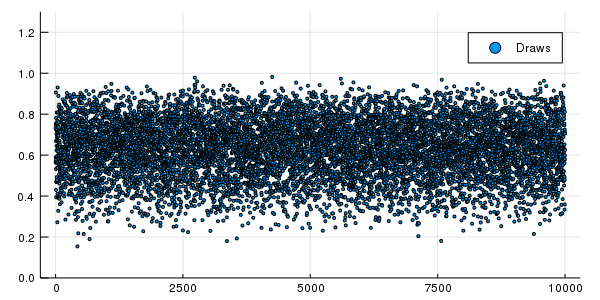

In [8]:
p = Vector{Plots.Plot{Plots.GRBackend}}(undef, 2)
p[1] = scatter(1:N, samples, markersize = 2, ylim=(0.0, 1.3), lab="Draws")

### snippet 3.5

Analytical calculation

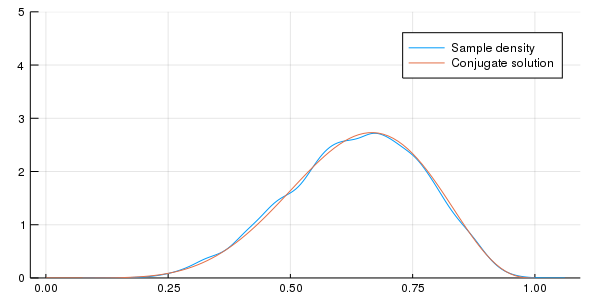

In [9]:
w = 6
n = 9
x = 0:0.01:1
p[2] = density(samples, ylim=(0.0, 5.0), lab="Sample density")
p[2] = plot!( x, pdf.(Beta( w+1 , n-w+1 ) , x ), lab="Conjugate solution")

Add quadratic approximation

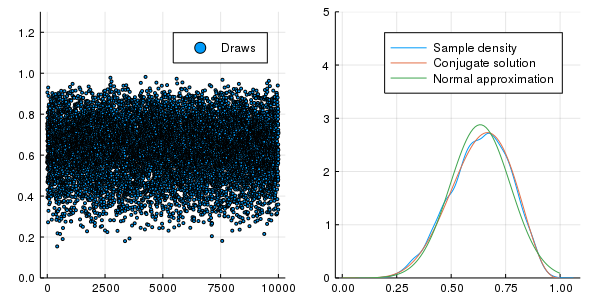

In [10]:
plot!( p[2], x, pdf.(Normal( fitnormal.μ, fitnormal.σ ) , x ), lab="Normal approximation")
plot(p..., layout=(1, 2))

End of `clip_02_05.jl`

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*